In [81]:
import pandas as pd
from bokeh.io import output_notebook
from bokeh.charts import show, Scatter, TimeSeries
from datetime import datetime, date

In [82]:
output_notebook()

Loading BokehJS ...

In [123]:
import matplotlib.pyplot as plt
import matplotlib

%matplotlib inline
plt.xkcd()

font = {'family': 'xkcd','weight' : 'regular','size'   : 12}
matplotlib.rc('font', **font)



Load **CSV**

In [84]:
drishti = pd.read_csv("drishti.csv")

In [85]:
drishti.tail(10)

,date,time,place,reading,type
127731,"Saturday,September 16,2017",11:00 PM,THE BRITISH SCHOOL,22,R
127732,"Saturday,September 16,2017",11:00 PM,BOUDHA,42,R
127733,"Saturday,September 16,2017",11:00 PM,BUDANILKANTHA,28,R
127734,"Saturday,September 16,2017",11:00 PM,HATTISAR,31,R
127735,"Saturday,September 16,2017",11:00 PM,KALANKI,31,R
127736,"Saturday,September 16,2017",11:00 PM,KOTESHWOR,32,R
127737,"Saturday,September 16,2017",11:00 PM,PUTALISADAK,26,R
127738,"Saturday,September 16,2017",11:00 PM,THAMEL,30,R
127739,"Saturday,September 16,2017",00:00 PM,THAPATHALI,24,R
127740,"Saturday,September 16,2017",11:00 PM,THE BRITISH SCHOOL,22,R


In [86]:
drishti.place.unique()

array(['GONGABU', 'KALANKI', 'KOTESHWOR', 'NEW BANESHWOR', 'PUTALISADAK',
       'SATDOBATO', 'THAMEL', 'BUDDHANILAKANTHA', 'BUDANILKANTHA',
       'KALANKI-LAB2', 'SAATDOBATO', 'KALANKI-LAB', 'MAHARAJGUNJ',
       'THAPATHALI', 'KALIMATI-KALANKI', 'EKANTAKUNA', 'NEW BANESWOR',
       'BAKHUNDOLE', 'SAMAKHUSI', 'JHAMSIKHEL', 'The British School',
       'THE BRITISH SCHOOL', 'HATTISAR', 'BALKHU', 'KALIMATI', 'BOUDHA',
       'GALKOPAKHA', 'GWARKO-BAFAL', 'BANSBARI', 'SWAYAMBU'], dtype=object)

Replace mispelt names in **place** column

In [87]:
drishti.replace(['NEW BANESWOR', 'SAATDOBATO', 'The British School', 'THE BRITISH SCHOOL', 'BUDDHANILAKANTHA', 'KALANKI-LAB'],
                      ['NEW BANESHWOR',  'SATDOBATO', 'BRITISH SCHOOL', 'BRITISH SCHOOL', 'BUDANILKANTHA', 'KALANKI-LAB1'],
                     inplace=True)


Convert **date** feild to date

In [88]:
drishti.date = pd.to_datetime(drishti.date, format='%A,%B %d,%Y')

In [89]:
p = Scatter(drishti, x='place', y='reading', color='place', legend=False)
show(p)


Drop anamoly reading above 500 and drop places with little readings

In [90]:
df = drishti

In [91]:
df = df.drop(df[df.reading > 500].index)
df = df.drop(df[(df.place=='KALANKI-LAB1') | 
                (df.place=='KALANKI-LAB2') | 
                (df.place=='GWARKO-BAFAL') | 
                (df.place=='JHAMSIKHEL')].index)

In [92]:
p = Scatter(df, x='place', y='reading', color='place', legend=False)
show(p)

In [140]:
tmp = df[df.place=='BOUDHA']
tmp = tmp.sort_values(by=['date'], ascending=True)
tseries = TimeSeries(tmp, x='date', y='reading', color='red')
show(tseries)

In [144]:
place = 'KALIMATI'
tmp = df[df.place==place]
tmp.set_index('date', inplace=True)

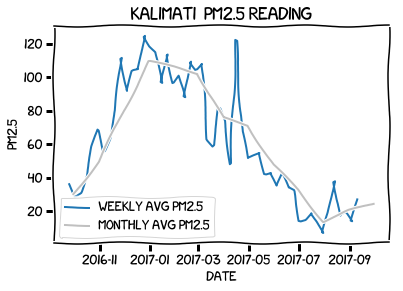

In [145]:
tmpweekly = tmp.resample('W').mean()
plt.plot(tmpweekly.index, tmpweekly.reading, label='WEEKLY AVG PM2.5')
plt.xlabel('DATE')
plt.ylabel('PM2.5')
plt.legend()
tmpmonthly = tmp.resample('M').mean()
plt.plot(tmpmonthly.index, tmpmonthly.reading, label='MONTHLY AVG PM2.5', color='#c0c0c0')
plt.legend()
plt.title(place+'  PM2.5 READING', size= 16)

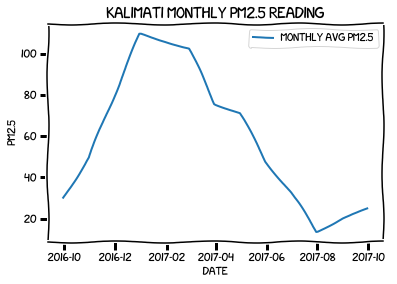

In [111]:
tmpmonthly = tmp.resample('M').mean()
plt.plot(tmpmonthly.index, tmpmonthly.reading, label='MONTHLY AVG PM2.5')
plt.xlabel('DATE')
plt.ylabel('PM2.5')
plt.legend()
plt.title(place+' MONTHLY PM2.5 READING', size= 14)

In [ ]:
tmpmonthly = tmp.resample('M').mean()
plt.plot(tmpmonthly.index, tmpmonthly.reading)

In [ ]:
fig = plt.figure()
ax1 = fig.add_subplot(211)
ax2 = fig.add_subplot(212)

tmpmonthly = tmp.resample('M').median()
ax1.plot(tmpmonthly.index, tmpmonthly.reading)

tmpmonthly = tmp.resample('M').mean()
ax2.plot(tmpmonthly.index, tmpmonthly.reading)

In [158]:
place = 'KALIMATI'
tmp = df[df.place==place]

In [160]:
tmp.head()

,date,time,place,reading,type
10857,2016-09-23,09:00 AM,KALIMATI,43,R
10871,2016-09-23,09:00 AM,KALIMATI,43,R
10885,2016-09-23,09:00 AM,KALIMATI,43,R
10899,2016-09-23,09:00 AM,KALIMATI,43,H
10911,2016-09-23,09:00 AM,KALIMATI,43,R


In [169]:
tmp[(tmp.place == 'KALIMATI') & (tmp.date.dt.year==2016) & (tmp.date.dt.month==9)].reading.mean()

30.210526315789473